In [1]:
import cv2
import os
import glob
import matplotlib.pyplot as plt
import numpy as np
from typing import List, Tuple
from pipeline import Pipeline
from statistics import mean
from timeit import default_timer as timer
from operator import itemgetter

In [2]:
os.chdir("../")

## IMAGE MATCHING - WHOLE ROUTE

In [3]:
def load_image(path: str) -> np.ndarray:
    
    img = cv2.imread(path)
    if img is None:
        raise FileNotFoundError
    else: return img

def display_image(image: np.ndarray, figsize=(7,7)) -> None:
    
    fig = plt.figure(figsize=figsize)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()
    
def detectAndCompute(
    image: np.ndarray,
    featureDetector: cv2.Feature2D,
    **kwargs
) -> Tuple[cv2.KeyPoint, np.ndarray]:
    
    return featureDetector.detectAndCompute(image, None)

def findGoodMatches(
    des1: np.ndarray, 
    des2: np.ndarray, 
    matcher: cv2.DescriptorMatcher, 
    threshold: float = 0.75, 
    KNN: bool = True
) -> Tuple[Tuple, Tuple]:
    
    if KNN:
        matches = matcher.knnMatch(des1, des2, k=2)
    else: matches = matcher.BFMatcher(des1, des2)
    return [[m] for m, n in matches if m.distance < threshold*n.distance]

def drawMatches(
    image1: np.ndarray,
    image2: np.ndarray,
    keypoints1: cv2.KeyPoint,
    keypoints2: cv2.KeyPoint,
    matches: Tuple[Tuple, Tuple]
) -> np.ndarray:
    
    return cv2.drawMatchesKnn(image1, keypoints1, image2, keypoints2,
                              matches, None)

In [4]:
green = load_image('img/ref_mixed_green.png')
blue = load_image('img/ref_mixed_blue.png')
red = load_image('img/ref_mixed_red.png')
refs = [green, blue, red]

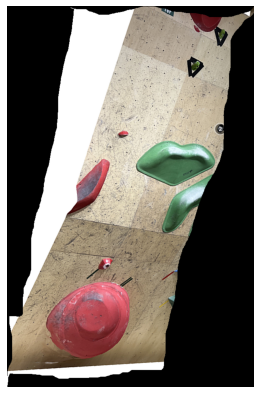

In [5]:
pov = load_image("img/pov_mixed_red_3.png")
display_image(pov)

Class 0: 229


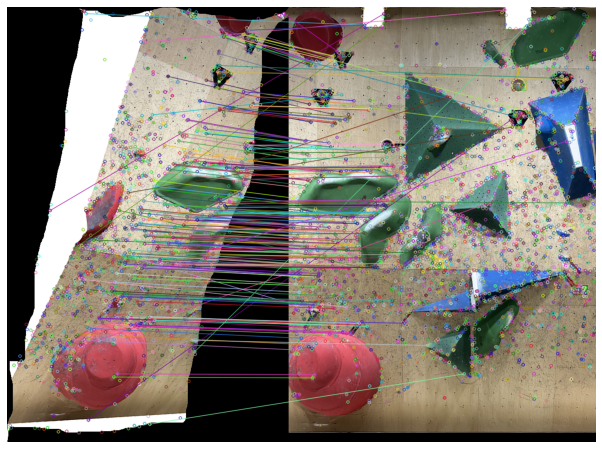

Class 1: 28


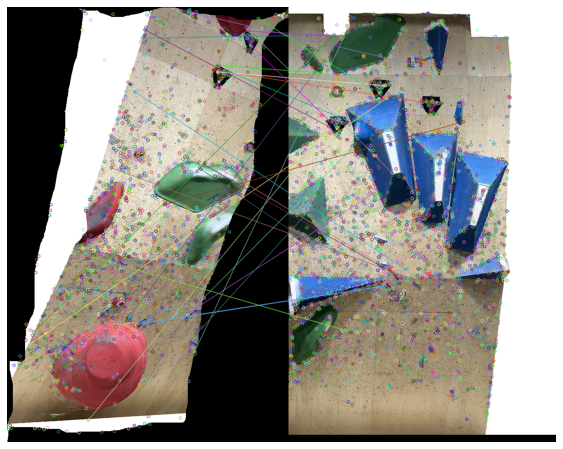

Class 2: 432


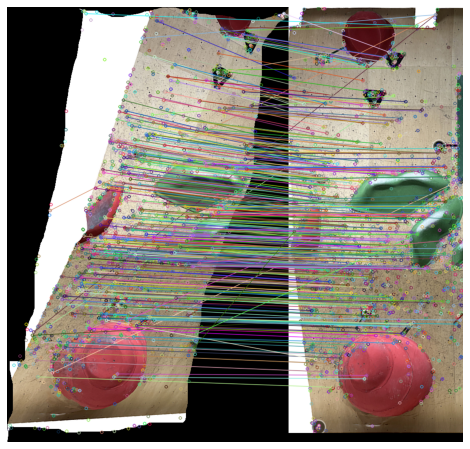

FINAL PROBS:
Class_0 : 33.236574746008706%
Class_1 : 4.063860667634253%
Class_2 : 62.699564586357035%


In [6]:
count = {}
for i, ref in enumerate(refs):
    sift = cv2.SIFT_create()
    kp1, des1 = detectAndCompute(pov, sift)
    kp2, des2 = detectAndCompute(ref, sift)

    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)   # or pass empty dictionary
    flann = cv2.FlannBasedMatcher(index_params,search_params)

    matches = findGoodMatches(des1, des2, flann)

    print(f'Class {i}: {len(matches)}')
    count[f'Class_{i}'] = len(matches)
    display_image(
        drawMatches(pov, ref, kp1, kp2, matches),
        figsize=(15, 8)
    )

print('FINAL PROBS:')
print(*(f'{key} : {val/sum(count.values())*100}%' for key,val in count.items()), sep='\n')

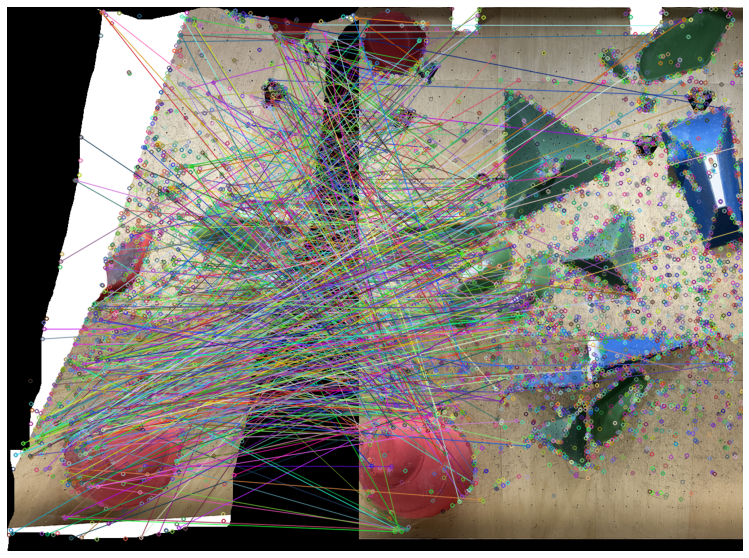

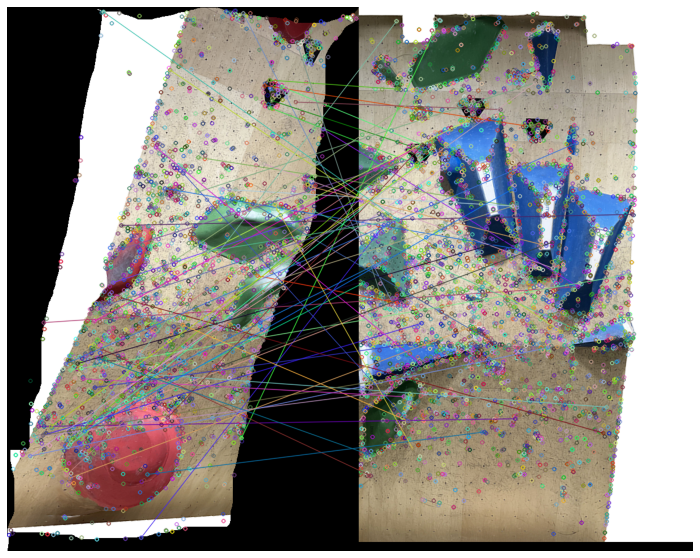

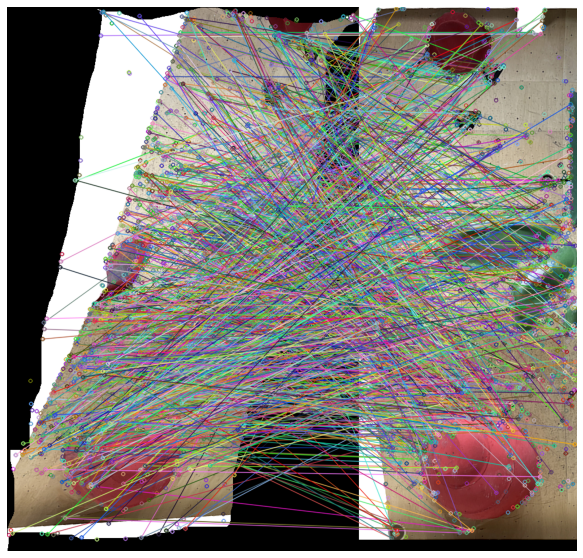

FINAL PROBS:
Class_0 : 36.19718309859155%
Class_1 : 3.3802816901408446%
Class_2 : 60.4225352112676%


In [7]:
count = {}
for i, ref in enumerate(refs):
    acc = []
    matches = []
    kps1 = []
    kps2 = [] 
    for channel1, channel2 in zip(cv2.split(pov), cv2.split(ref)):
        sift = cv2.SIFT_create()
        kp1, des1 = detectAndCompute(channel1, sift)
        kp2, des2 = detectAndCompute(channel2, sift)
        kps1 += kp1
        kps2 += kp2

        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
        search_params = dict(checks=50)   # or pass empty dictionary
        flann = cv2.FlannBasedMatcher(index_params,search_params)

        match = findGoodMatches(des1, des2, flann)
        matches += match
    
    acc.append(len(match))
    display_image(
        drawMatches(pov, ref, kps1, kps2, matches),
        figsize=(20,10)
    )
    
    count[f'Class_{i}'] = mean(acc)

print('FINAL PROBS:')
print(*(f'{key} : {val/sum(count.values())*100}%' for key,val in count.items()), sep='\n')

## IMAGE MATCHING - START HOLD

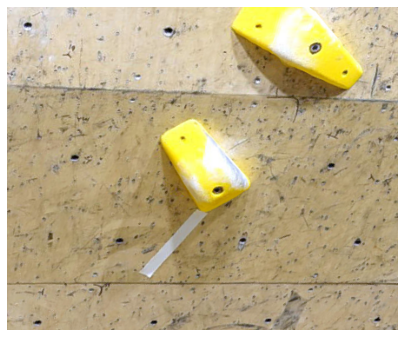

In [8]:
hold_green = load_image('img/ref_hold_green.png')
hold_blue = load_image('img/ref_hold_blue.png')
hold_red = load_image('img/ref_hold_red.png')
hold_lime = load_image('img/ref_hold_lime.png')
hold_yellow = load_image('img/ref_hold_yellow.png')
refs_hold = [hold_green, hold_blue, hold_red, hold_lime, hold_yellow]
pov_hold = load_image("img/pov_hold_yellow_2.png")
display_image(pov_hold)

Class 0: 14


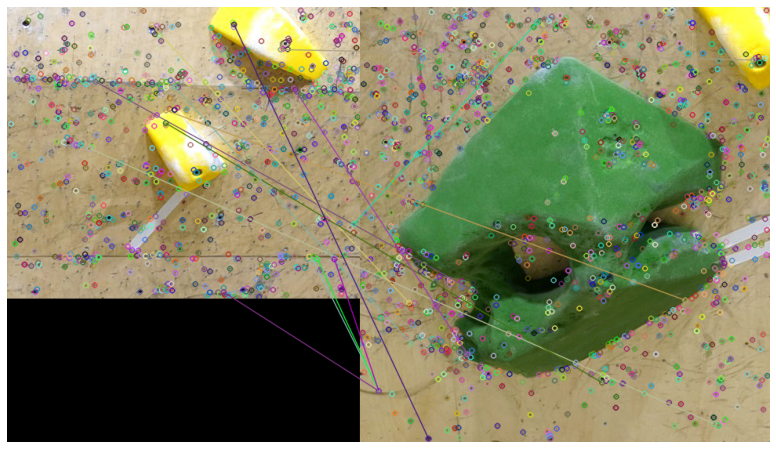

Class 1: 10


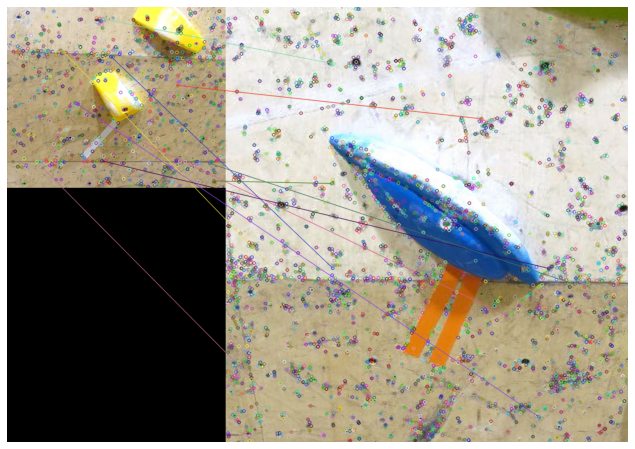

Class 2: 8


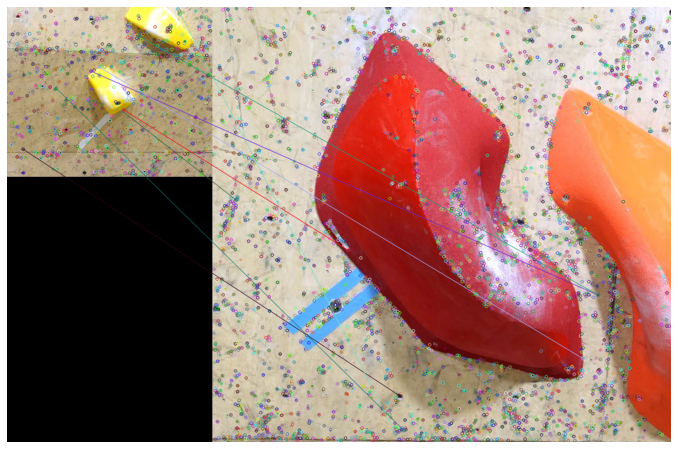

Class 3: 9


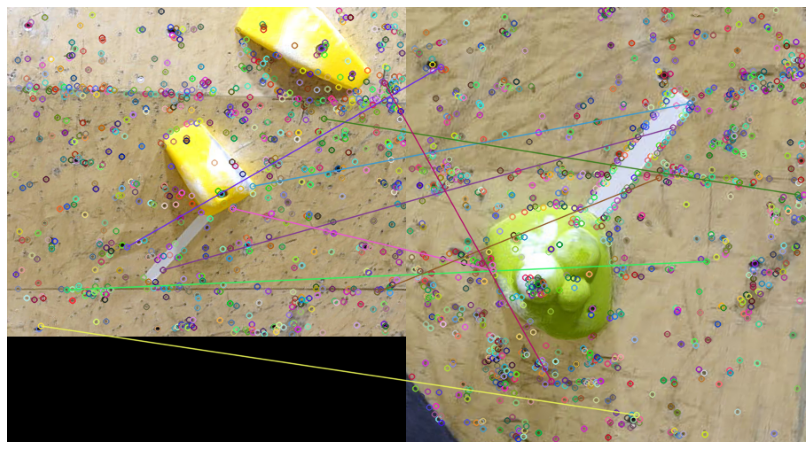

Class 4: 118


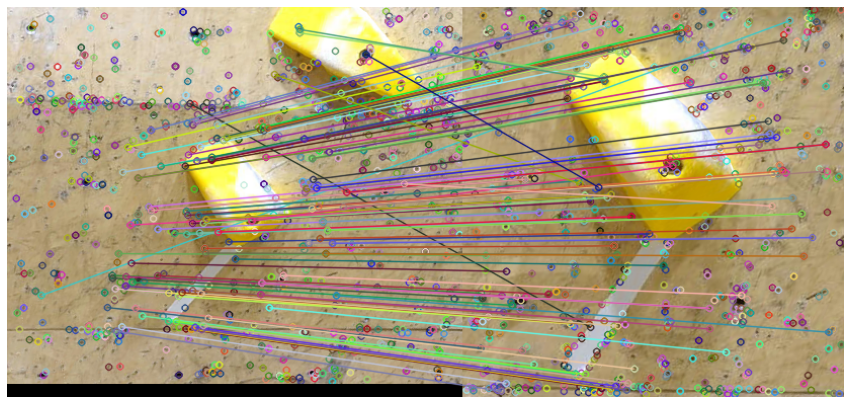

FINAL PROBS:
Class_0 : 8.80503144654088%
Class_1 : 6.289308176100629%
Class_2 : 5.031446540880504%
Class_3 : 5.660377358490567%
Class_4 : 74.21383647798741%


In [9]:
count = {}
for i, ref in enumerate(refs_hold):
    sift = cv2.SIFT_create()
    kp1, des1 = detectAndCompute(pov_hold, sift)
    kp2, des2 = detectAndCompute(ref, sift)

    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)   # or pass empty dictionary
    flann = cv2.FlannBasedMatcher(index_params,search_params)

    matches = findGoodMatches(des1, des2, flann)

    print(f'Class {i}: {len(matches)}')
    count[f'Class_{i}'] = len(matches)
    display_image(
        drawMatches(pov_hold, ref, kp1, kp2, matches),
        figsize=(15, 8)
    )

print('FINAL PROBS:')
print(*(f'{key} : {val/sum(count.values())*100}%' for key,val in count.items()), sep='\n')

## PERFORMANCE ANALYSIS
Simulating a scenario with 42 targets (precomputed descriptors) using starting holds.

In [10]:
ref_list = glob.glob('img/ref_hold_*.png')
ref_list
refs = []
for path in ref_list:
    refs.append(load_image(path))
refs_dict = {}
sift = cv2.SIFT_create()
for i, ref in enumerate(refs):
    refs_dict[i] = {}
    refs_dict[i]['img'] = ref
    kp, des = detectAndCompute(ref, sift)
    refs_dict[i]['kp'] = kp
    refs_dict[i]['des'] = des

In [11]:
pov = load_image('img/ref_hold_green_forest.png')
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)

TOTAL COMPUTATION TIME: 9.259012900000016
TOP 5 RESULTS:


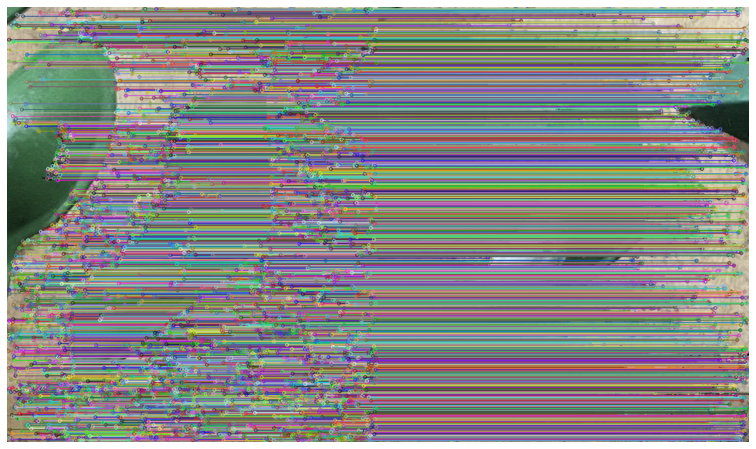

Counts: 5265


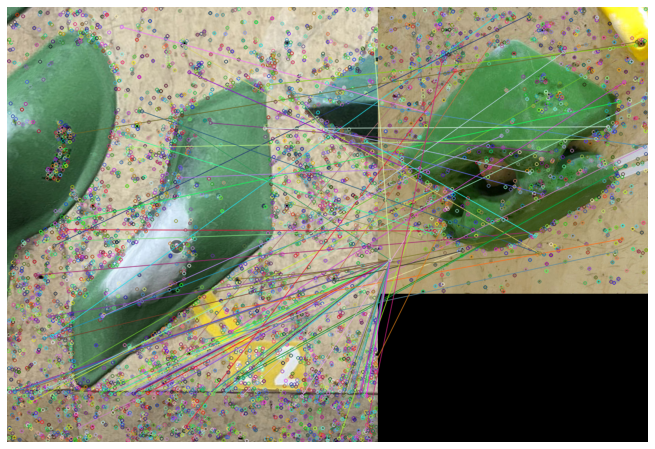

Counts: 86


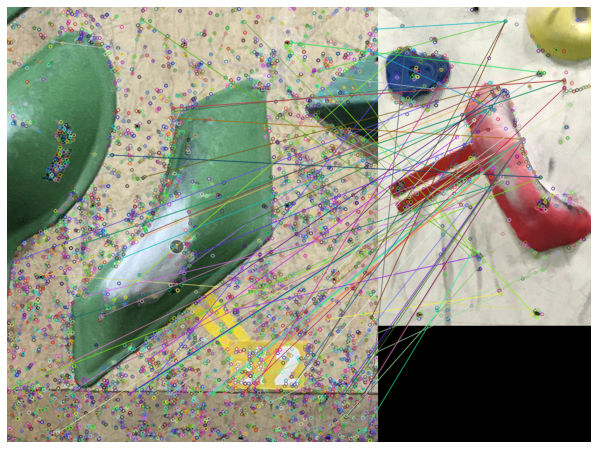

Counts: 77


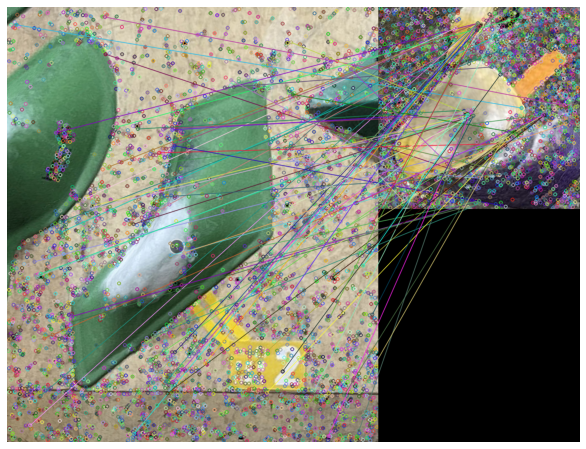

Counts: 74


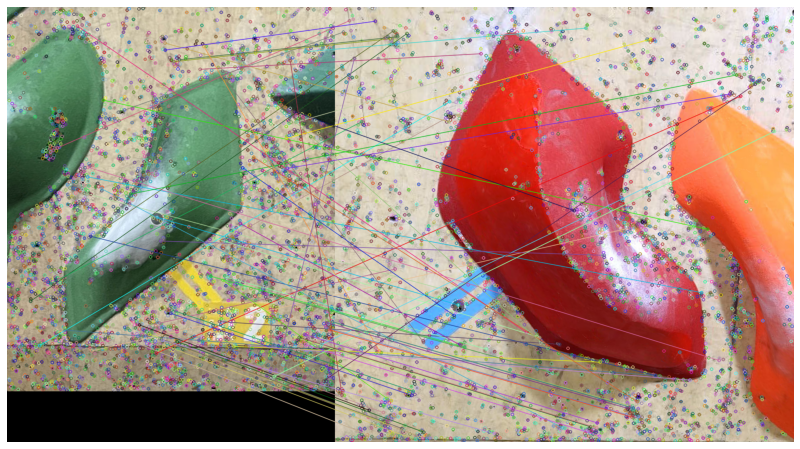

Counts: 73


In [12]:
start = timer()
kp, des = detectAndCompute(pov, sift)
counts = {}
for c, r in refs_dict.items():
    matches = findGoodMatches(des, r['des'], flann)
    counts[c] = len(matches)
    refs_dict[c]['matches'] = matches
end = timer()
print(f'TOTAL COMPUTATION TIME: {end-start}')

print('TOP 5 RESULTS:')
res = dict(sorted(counts.items(), key = itemgetter(1), reverse = True)[:5])
for k in res.keys():
    display_image(
        drawMatches(pov, refs_dict[k]['img'], kp, refs_dict[k]['kp'], refs_dict[k]['matches']),
        figsize=(15, 8)
    )
    print(f'Counts: {counts[k]}')

## PERFORMANCE ANALYSIS (RESIZING TEST)
Simulating a scenario with 42 targets (precomputed descriptors) using starting holds and downgrading size to improve retrieval time. 

In [13]:
SIZE_REDUCTION_PCT = 60
refs_dict = {}
sift = cv2.SIFT_create()
for i, ref in enumerate(refs):
    width = int(ref.shape[1] * SIZE_REDUCTION_PCT / 100)
    height = int(ref.shape[0] * SIZE_REDUCTION_PCT / 100)
    dim = (width, height)  
    # resize image
    resized = cv2.resize(ref, dim, interpolation = cv2.INTER_AREA)
    refs_dict[i] = {}
    refs_dict[i]['img'] = resized
    kp, des = detectAndCompute(resized, sift)
    refs_dict[i]['kp'] = kp
    refs_dict[i]['des'] = des

In [14]:
pov = load_image('img/ref_hold_black.png')
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)

TOTAL COMPUTATION TIME: 2.1242118999999775
TOP 5 RESULTS:


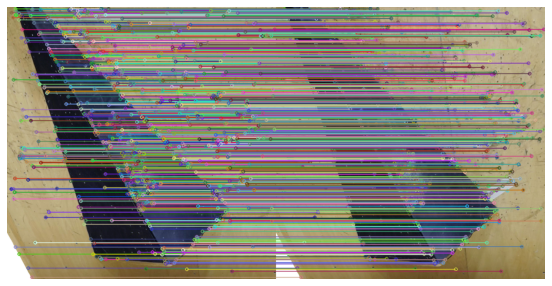

Counts: 1021


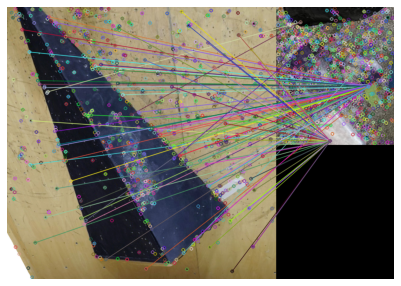

Counts: 95


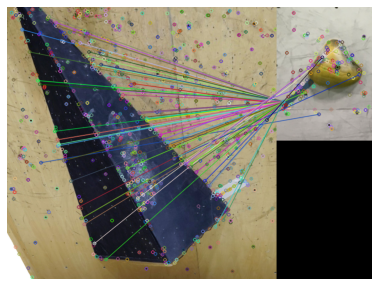

Counts: 66


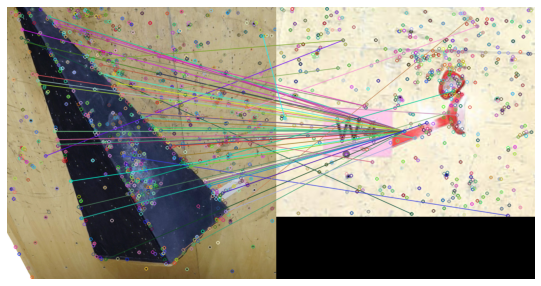

Counts: 56


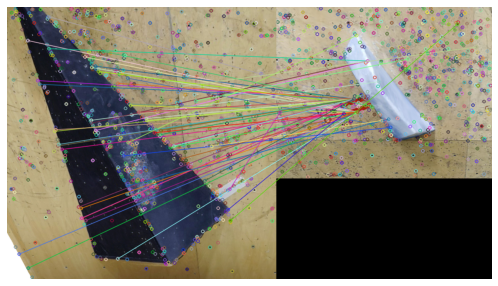

Counts: 53


In [15]:
start = timer()
width = int(pov.shape[1] * SIZE_REDUCTION_PCT / 100)
height = int(pov.shape[0] * SIZE_REDUCTION_PCT / 100)
dim = (width, height)  
# resize image
pov_resized = cv2.resize(pov, dim, interpolation = cv2.INTER_AREA)
kp, des = detectAndCompute(pov_resized, sift)
counts = {}
for c, r in refs_dict.items():
    matches = findGoodMatches(des, r['des'], flann)
    counts[c] = len(matches)
    refs_dict[c]['matches'] = matches
end = timer()
print(f'TOTAL COMPUTATION TIME: {end-start}')

print('TOP 5 RESULTS:')
res = dict(sorted(counts.items(), key = itemgetter(1), reverse = True)[:5])
for k in res.keys():
    display_image(
        drawMatches(pov_resized, refs_dict[k]['img'], kp, refs_dict[k]['kp'], refs_dict[k]['matches']),
        figsize=(10, 5)
    )
    print(f'Counts: {counts[k]}')

## PERFORMANCE ANALYSIS (AVG RATIO OF FIRST RESULT & PRECISION)
Simulating a scenario with 42 targets (precomputed descriptors) using starting holds and computing % ratio between first result and second.

In [16]:
povs_dict = {
    0:{'file':'img/pov_hold_blue_1.png','class':9},
    1:{'file':'img/pov_hold_blue_2.png','class':9},
    2:{'file':'img/pov_hold_green_1.png','class':15},
    3:{'file':'img/pov_hold_green_2.png','class':15},
    4:{'file':'img/pov_hold_lime_1.png','class':20},
    5:{'file':'img/pov_hold_lime_2.png','class':20},
    6:{'file':'img/pov_hold_red_1.png','class':26},
    7:{'file':'img/pov_hold_red_2.png','class':26},
    8:{'file':'img/pov_hold_yellow_1.png','class':34},
    9:{'file':'img/pov_hold_yellow_2.png','class':34},
}

for val in povs_dict.values():
    val['img'] = load_image(val['file'])

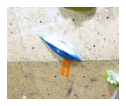

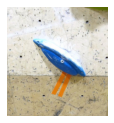

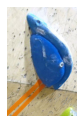

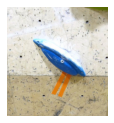

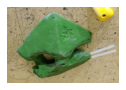

...

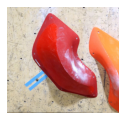

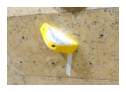

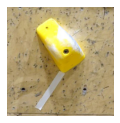

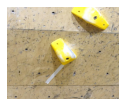

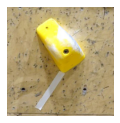

AVG Ratio 1st vs 2nd result: 3.10
AVG compare time: 1.53s
Precision: 100.00%


In [17]:
ratio1vs2 = []
correctClass = []
compareTime = []
for target in povs_dict.values():
    start = timer()
    width = int(target['img'].shape[1] * SIZE_REDUCTION_PCT / 100)
    height = int(target['img'].shape[0] * SIZE_REDUCTION_PCT / 100)
    dim = (width, height)  
    pov_resized = cv2.resize(target['img'], dim, interpolation = cv2.INTER_AREA)
    kp, des = detectAndCompute(pov_resized, sift)
    counts = {}
    for c, r in refs_dict.items():
        matches = findGoodMatches(des, r['des'], flann)
        counts[c] = len(matches)
        refs_dict[c]['matches'] = matches
    end = timer()
    
    compareTime.append(end-start)
    res = dict(sorted(counts.items(), key = itemgetter(1), reverse = True)[:2])
    correctClass.append(1) if (*res.keys(),)[0]==target['class'] else correctClass.append(0)
    ratio1vs2.append(counts[(*res.keys(),)[0]]/counts[(*res.keys(),)[1]])
    display_image(target['img'], figsize=(2,2))
    display_image(refs_dict[(*res.keys(),)[0]]['img'], figsize=(2,2))

print(f'AVG Ratio 1st vs 2nd result: {mean(ratio1vs2):.2f}')
print(f'AVG compare time: {mean(compareTime):.2f}s')
print(f'Precision: {mean(correctClass)*100:.2f}%')

## COLOR ISOLATION

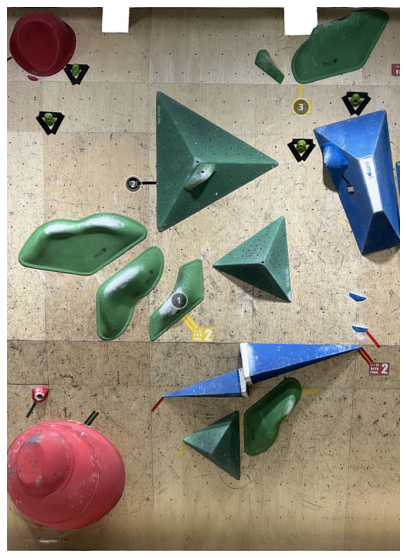

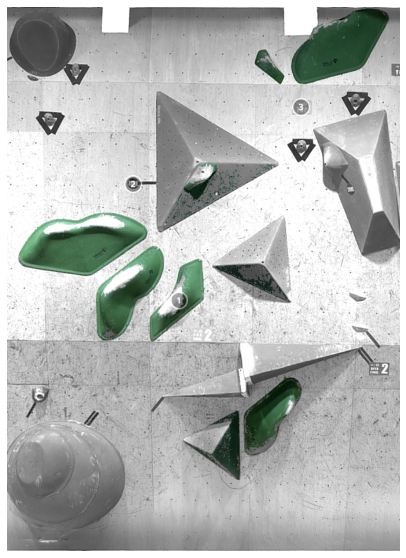

In [18]:
ref = green.copy()
hsv_val = (134,42,44)

display_image(ref, (10,10))

hsv = cv2.cvtColor(ref, cv2.COLOR_BGR2HSV)
gray = cv2.cvtColor(ref, cv2.COLOR_RGB2GRAY)

lower = np.array([(hsv_val[0]/2)-10, 0, 0])
upper = np.array([(hsv_val[0]/2)+10, 255, 255])

mask = cv2.inRange(hsv, lower, upper)
mask_inv = cv2.bitwise_not(mask)
res = cv2.bitwise_and(ref, ref, mask=mask)
gray = cv2.add(gray, 50.0)
background = cv2.bitwise_and(gray, gray, mask = mask_inv)
background = np.stack((background,)*3, axis=-1)

img_ca = cv2.add(res, background)

display_image(img_ca, (10,10))

## HOLD CONTOUR DETECTION

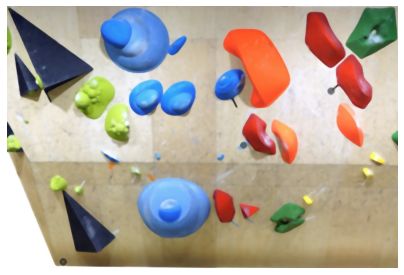

In [172]:
ref = load_image('img/ref_mixed_all.jpg')
ref = cv2.medianBlur(ref, 9)
display_image(ref)

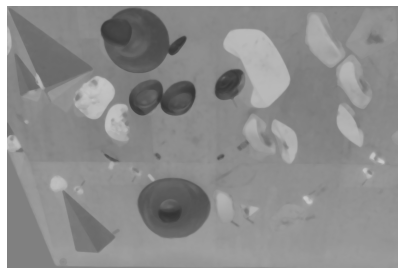

140.0

In [176]:
ref_gray = cv2.cvtColor(ref, cv2.COLOR_BGR2LAB)
display_image(ref_gray[:,:,2])

color_mean = np.median(ref_gray[:,:,2])
MARGIN = 20
color_mean

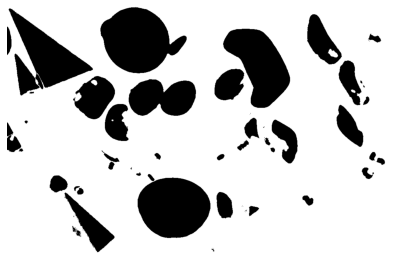

In [177]:

ret1, thresh1 = cv2.threshold(ref_gray[:,:,2], 120, 255, cv2.THRESH_BINARY)
ret2, thresh2 = cv2.threshold(ref_gray[:,:,2], 150, 255, cv2.THRESH_BINARY_INV)
masked = cv2.inRange(ref_gray[:,:,2], color_mean-MARGIN, color_mean+MARGIN)
thresh = thresh1+thresh2
display_image(masked)

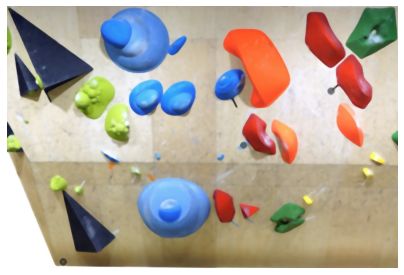

In [178]:
contours, hierarchy = cv2.findContours(masked, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
                                     
image_copy = ref.copy()
# cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
display_image(image_copy)

In [183]:
contours_big = []
for c in contours:
    if c.shape[0]>0: 
        contours_big.append(c)
        print(c.shape)


(3888, 1, 2)
(4, 1, 2)
(4, 1, 2)
(25, 1, 2)
(4, 1, 2)
(6, 1, 2)
(4, 1, 2)
(12, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(64, 1, 2)
(1, 1, 2)
(6, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(6, 1, 2)
(4, 1, 2)
(60, 1, 2)
(1, 1, 2)
(4, 1, 2)
(6, 1, 2)
(4, 1, 2)
(10, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(13, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(87, 1, 2)
(4, 1, 2)
(4, 1, 2)
(90, 1, 2)
(425, 1, 2)
(1, 1, 2)
(1, 1, 2)
(1, 1, 2)
(198, 1, 2)
(58, 1, 2)
(47, 1, 2)
(548, 1, 2)
(147, 1, 2)
(52, 1, 2)
(15, 1, 2)
(37, 1, 2)
(100, 1, 2)
(17, 1, 2)
(58, 1, 2)
(4, 1, 2)
(67, 1, 2)
(56, 1, 2)
(53, 1, 2)
(99, 1, 2)
(66, 1, 2)
(4, 1, 2)
(21, 1, 2)
(33, 1, 2)
(40, 1, 2)
(4, 1, 2)
(98, 1, 2)
(1, 1, 2)
(71, 1, 2)
(6, 1, 2)
(10, 1, 2)
(6, 1, 2)
(29, 1, 2)
(319, 1, 2)
(163, 1, 2)
(4, 1, 2)
(6, 1, 2)
(269, 1, 2)
(303, 1, 2)
(13, 1, 2)
(62, 1, 2)
(4, 1, 2)
(33, 1, 2)
(15, 1, 2)
(4, 1, 2)
(4, 1, 2)
(22, 1, 2)
(522, 1, 2)
(373, 1, 2)
(44, 1, 2)
(9

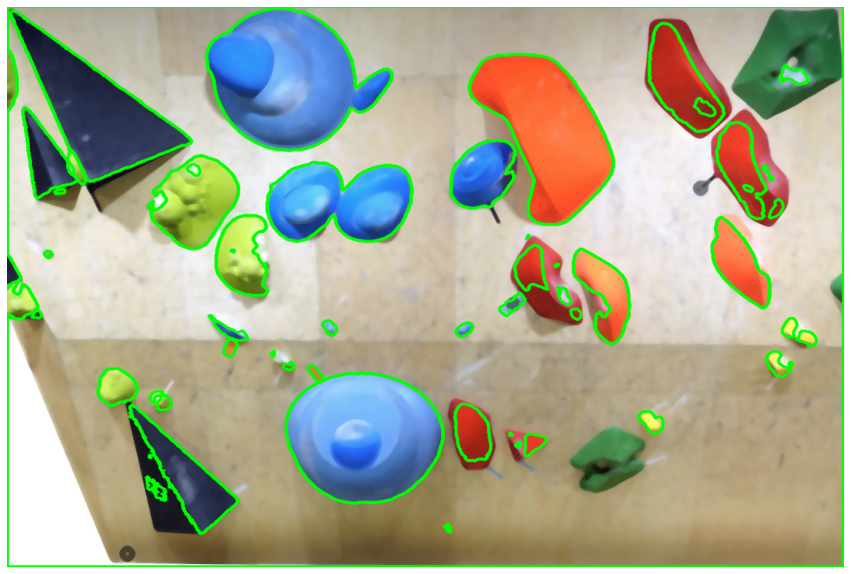

In [184]:
cv2.drawContours(image=image_copy, contours=contours_big, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
               
display_image(image_copy, figsize=(15,15))